In [3]:
!pip install h5py
!pip install typing-extensions
!pip install wheel

In [4]:
!pip install dataprep

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 10.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 66.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 52.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 55.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 66.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.0/764.0 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 37.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 50.1 MB/s eta 0:00:00
  Created wheel for sqlalchemy: filename=S

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from dataprep.eda import create_report

In [6]:
bank_data = pd.read_excel('PD_modelling_dataset.xlsx')
bank_data.head()

,userid,default,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_status,acct_worst_status_0_3m,acct_worst_status_12_24m,...,num_arch_ok_12_24m,num_arch_rem_0_12m,status_max_archived_0_6_months,status_max_archived_0_12_months,status_max_archived_0_24_months,recovery_debt,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours
0,4567129.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,NaN,...,14.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,178839.0,9.653333
1,2635118.0,0.0,0.0,0.0,0.0,0.0,NaN,1.0,1.0,1.0,...,19.0,3.0,1.0,2.0,2.0,0.0,0.0,0.0,49014.0,13.181389
2,4804232.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,3.0,1.0,2.0,2.0,0.0,0.0,0.0,124839.0,11.561944
3,1442693.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,21.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,324676.0,15.751111
4,4575322.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,7100.0,12.698611


In [7]:
bank_data = bank_data.drop(['userid','name_in_email'], axis=1)
bank_data.head()

,default,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_status,acct_worst_status_0_3m,acct_worst_status_12_24m,acct_worst_status_3_6m,...,num_arch_ok_12_24m,num_arch_rem_0_12m,status_max_archived_0_6_months,status_max_archived_0_12_months,status_max_archived_0_24_months,recovery_debt,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,NaN,1.0,...,14.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,178839.0,9.653333
1,0.0,0.0,0.0,0.0,0.0,NaN,1.0,1.0,1.0,1.0,...,19.0,3.0,1.0,2.0,2.0,0.0,0.0,0.0,49014.0,13.181389
2,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,1.0,2.0,2.0,0.0,0.0,0.0,124839.0,11.561944
3,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,21.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,324676.0,15.751111
4,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,7100.0,12.698611


In [8]:
bank_data = bank_data.drop_duplicates()

In [7]:
bank_data.describe().T

,count,mean,std,min,25%,50%,75%,max
default,87325.0,0.129173,33.840191,0.0,0.000000,0.000000,0.000000,1.000000e+04
acct_amt_added_12_24m,97170.0,12609.044232,35928.099198,0.0,0.000000,0.000000,5745.750000,1.128775e+06
acct_days_in_dc_12_24m,85569.0,0.368066,40.888281,0.0,0.000000,0.000000,0.000000,1.183600e+04
acct_days_in_rem_12_24m,85569.0,5.334514,46.619866,0.0,0.000000,0.000000,0.000000,1.183600e+04
acct_days_in_term_12_24m,85569.0,0.433837,40.570023,0.0,0.000000,0.000000,0.000000,1.183600e+04
acct_incoming_debt_vs_paid_0_24m,40647.0,2.790915,295.388461,0.0,0.000000,0.152443,0.663107,5.931500e+04
acct_status,45578.0,2.235135,254.681546,1.0,1.000000,1.000000,1.000000,5.437300e+04
acct_worst_status_0_3m,45578.0,2.365944,254.681199,1.0,1.000000,1.000000,1.000000,5.437300e+04
acct_worst_status_12_24m,33210.0,3.347636,366.336532,1.0,1.000000,1.000000,2.000000,6.676100e+04
acct_worst_status_3_6m,42256.0,2.550857,280.697338,1.0,1.000000,1.000000,1.000000,5.770200e+04


In [9]:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 97171 entries, 0 to 99978
Data columns (total 34 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   default                           87325 non-null  float64
 1   acct_amt_added_12_24m             97170 non-null  float64
 2   acct_days_in_dc_12_24m            85569 non-null  float64
 3   acct_days_in_rem_12_24m           85569 non-null  float64
 4   acct_days_in_term_12_24m          85569 non-null  float64
 5   acct_incoming_debt_vs_paid_0_24m  40647 non-null  float64
 6   acct_status                       45578 non-null  float64
 7   acct_worst_status_0_3m            45578 non-null  float64
 8   acct_worst_status_12_24m          33210 non-null  float64
 9   acct_worst_status_3_6m            42256 non-null  float64
 10  acct_worst_status_6_12m           39610 non-null  float64
 11  age                               97170 non-null  float64
 12  avg_

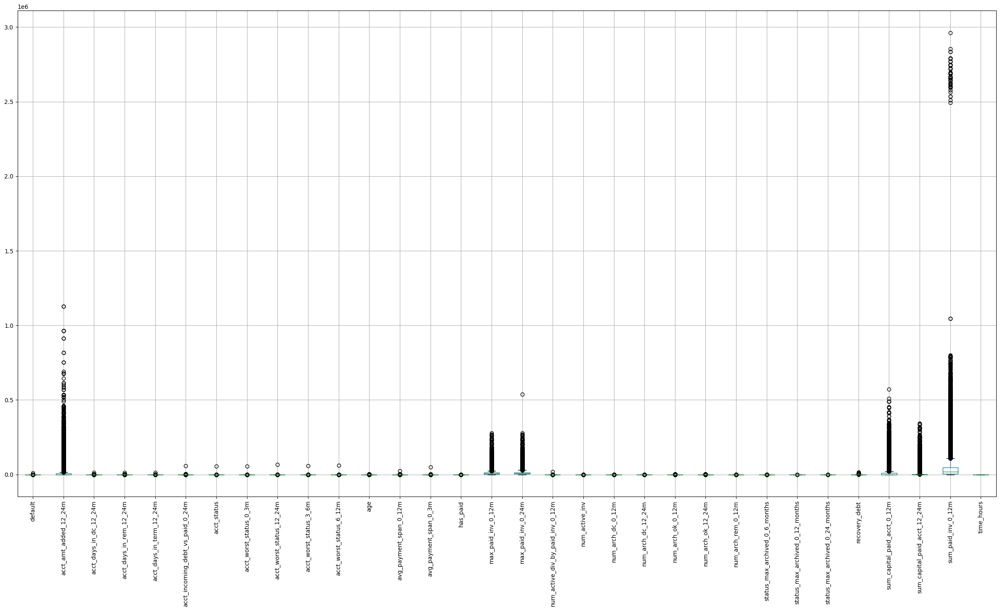

In [10]:
plt.figure(figsize=(30,15))
bank_data.boxplot();
plt.xticks(rotation= 90)
plt.show()

Computing values-131f01a64fd0a65a522cd09b54285cff:   0%|          | 8/5883 [00:00<01:15, 77.90it/s]/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5279: RuntimeWarning: invalid value encountered in sqrt
  z = con_minus_dis / np.sqrt(var)
Computing ks_2samp-6d0088d3710821ec1abfea173b879aec:  16%|█▌        | 919/5883 [00:10<00:12, 383.52it/s]/usr/local/lib/python3.10/dist-packages/dataprep/eda/utils.py:392: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  return cast(Tuple[float, float], ks_2samp_(data1, data2))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and w

DataPrep Report
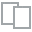
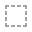
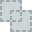
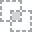
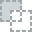
...
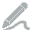
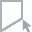
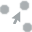
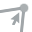
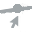

In [11]:
report_unclean = create_report(bank_data)
report_unclean

<ipython-input-11-4b44f61d20fb>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = bank_data.corr()


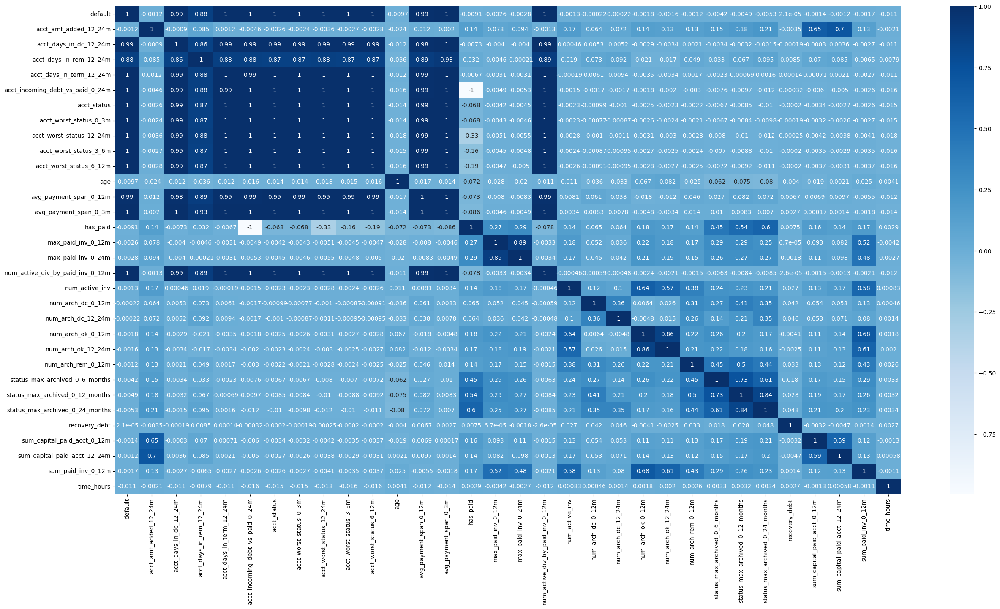

In [11]:
corr = bank_data.corr()
plt.figure(figsize=(30,15))
sns.heatmap(corr, annot= True, cmap='Blues');

In [12]:
bank_data.isnull().sum()

default                              9846
acct_amt_added_12_24m                   1
acct_days_in_dc_12_24m              11602
acct_days_in_rem_12_24m             11602
acct_days_in_term_12_24m            11602
acct_incoming_debt_vs_paid_0_24m    56524
acct_status                         51593
acct_worst_status_0_3m              51593
acct_worst_status_12_24m            63961
acct_worst_status_3_6m              54915
acct_worst_status_6_12m             57561
age                                     1
avg_payment_span_0_12m              21120
avg_payment_span_0_3m               46534
merchant_category                       1
merchant_group                         10
has_paid                             8231
max_paid_inv_0_12m                   8231
max_paid_inv_0_24m                   8231
num_active_div_by_paid_inv_0_12m    27119
num_active_inv                       8231
num_arch_dc_0_12m                    8231
num_arch_dc_12_24m                   8231
num_arch_ok_0_12m                 

In [13]:
numeric_columns = bank_data.select_dtypes(include=[pd.np.number])
bank_data[numeric_columns.columns] = bank_data[numeric_columns.columns].fillna(numeric_columns.median())

<ipython-input-13-8df26c8c0f54>:1: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead.
  numeric_columns = bank_data.select_dtypes(include=[pd.np.number])


In [14]:
bank_data['default'] = bank_data['default'].astype('object')
bank_data['acct_status']= bank_data['acct_status'].astype('object')
bank_data['merchant_category']= bank_data['merchant_category'].astype('object')
bank_data['merchant_group'] = bank_data['merchant_group'].astype('object')
bank_data['has_paid'] = bank_data['has_paid'].astype('object')

In [15]:
bank_data['default'].value_counts()

0.0        95890
1.0         1280
10000.0        1
Name: default, dtype: int64

In [16]:
bank_data = bank_data[bank_data['default'] != 10000]

In [17]:
cat_column = bank_data.select_dtypes('object')
cat_column.columns

Index(['default', 'acct_status', 'merchant_category', 'merchant_group',
       'has_paid'],
      dtype='object')

In [18]:
bank_data[cat_column.columns] = bank_data[cat_column.columns].fillna(cat_column.mode().iloc[0]).astype('category')

In [19]:
bank_data.isnull().sum()

default                             0
acct_amt_added_12_24m               0
acct_days_in_dc_12_24m              0
acct_days_in_rem_12_24m             0
acct_days_in_term_12_24m            0
acct_incoming_debt_vs_paid_0_24m    0
acct_status                         0
acct_worst_status_0_3m              0
acct_worst_status_12_24m            0
acct_worst_status_3_6m              0
acct_worst_status_6_12m             0
age                                 0
avg_payment_span_0_12m              0
avg_payment_span_0_3m               0
merchant_category                   0
merchant_group                      0
has_paid                            0
max_paid_inv_0_12m                  0
max_paid_inv_0_24m                  0
num_active_div_by_paid_inv_0_12m    0
num_active_inv                      0
num_arch_dc_0_12m                   0
num_arch_dc_12_24m                  0
num_arch_ok_0_12m                   0
num_arch_ok_12_24m                  0
num_arch_rem_0_12m                  0
status_max_a

In [20]:
bank_data['has_paid'].value_counts()

1.0    85233
0.0    11937
Name: has_paid, dtype: int64

In [20]:
bank_data['acct_status'].value_counts()

1.0    95260
2.0     1900
3.0        7
4.0        3
Name: acct_status, dtype: int64

In [21]:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 97170 entries, 0 to 99976
Data columns (total 34 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   default                           97170 non-null  category
 1   acct_amt_added_12_24m             97170 non-null  float64 
 2   acct_days_in_dc_12_24m            97170 non-null  float64 
 3   acct_days_in_rem_12_24m           97170 non-null  float64 
 4   acct_days_in_term_12_24m          97170 non-null  float64 
 5   acct_incoming_debt_vs_paid_0_24m  97170 non-null  float64 
 6   acct_status                       97170 non-null  category
 7   acct_worst_status_0_3m            97170 non-null  float64 
 8   acct_worst_status_12_24m          97170 non-null  float64 
 9   acct_worst_status_3_6m            97170 non-null  float64 
 10  acct_worst_status_6_12m           97170 non-null  float64 
 11  age                               97170 non-null  floa

In [23]:
bank_data['acct_status'].replace(1.0, 0, inplace=True)
bank_data['acct_status'].replace(2.0, 1, inplace=True)
bank_data =bank_data[(bank_data['acct_status'] != 3.0) & (bank_data['acct_status'] != 4.0)]

In [24]:
bank_data['acct_status'].value_counts()

0.0    95260
1.0     1900
3.0        0
4.0        0
Name: acct_status, dtype: int64

In [25]:
bank_data= bank_data.drop_duplicates()

Computing linkage-90ae238e-224d-4318-843c-e5416219720b:   7%|▋         | 435/5886 [00:01<00:13, 397.91it/s]                                              /usr/local/lib/python3.10/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
Computing ks_2samp-c8107ea5a5ec231edafa2f2e99a3fcad:  28%|██▊       | 1639/5886 [00:02<00:02, 1883.41it/s]/usr/local/lib/python3.10/dist-packages/dataprep/eda/utils.py:392: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  return cast(Tuple[float, float], ks_2samp_(data1, data2))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.

DataPrep Report
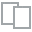
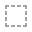
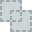
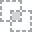
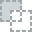
...
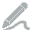
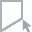
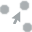
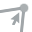
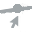

In [27]:
report = create_report(bank_data)
report

In [22]:
numeric= bank_data.select_dtypes(include=[pd.np.number]).columns

<ipython-input-22-21396c08d5e4>:1: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead.
  numeric= bank_data.select_dtypes(include=[pd.np.number]).columns


In [23]:
from scipy.stats import zscore

threshold = 3.0

bank_data_copy = bank_data.copy()

for col in numeric:
  z_scores = np.abs(zscore(bank_data_copy[col]))


In [24]:
bank_data_copy['z_score'] = z_scores
bank_data_copy.head()

,default,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_status,acct_worst_status_0_3m,acct_worst_status_12_24m,acct_worst_status_3_6m,...,num_arch_rem_0_12m,status_max_archived_0_6_months,status_max_archived_0_12_months,status_max_archived_0_24_months,recovery_debt,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours,z_score
0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,1.0,1.0,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,178839.0,9.653333,1.189699
1,0.0,0.0,0.0,0.0,0.0,0.152443,1.0,1.0,1.0,1.0,...,3.0,1.0,2.0,2.0,0.0,0.0,0.0,49014.0,13.181389,0.456924
2,0.0,0.0,0.0,0.0,0.0,0.152443,1.0,1.0,1.0,1.0,...,3.0,1.0,2.0,2.0,0.0,0.0,0.0,124839.0,11.561944,0.793282
3,0.0,0.0,0.0,0.0,0.0,0.152443,1.0,1.0,1.0,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,324676.0,15.751111,0.076806
4,0.0,0.0,0.0,0.0,0.0,0.152443,1.0,1.0,1.0,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,7100.0,12.698611,0.557197


In [25]:
bank_data_copy[(bank_data_copy['z_score']> 3.0)|(bank_data_copy['z_score']< -3.0)]

,default,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_status,acct_worst_status_0_3m,acct_worst_status_12_24m,acct_worst_status_3_6m,...,num_arch_rem_0_12m,status_max_archived_0_6_months,status_max_archived_0_12_months,status_max_archived_0_24_months,recovery_debt,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours,z_score
170,0.0,0.0,0.0,0.0,0.0,0.152443,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.096944,3.174555
227,0.0,87954.0,0.0,0.0,0.0,0.428790,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,0.0,66194.0,0.0,45835.0,0.775833,3.033551
271,0.0,0.0,0.0,0.0,0.0,0.152443,1.0,1.0,1.0,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,8335.0,0.823056,3.023743
288,0.0,0.0,0.0,0.0,0.0,0.152443,1.0,1.0,1.0,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,2880.0,0.449167,3.101399
313,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,1.0,1.0,1.0,...,0.0,0.0,1.0,1.0,0.0,9257.0,0.0,9440.0,0.923889,3.002799
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99076,0.0,0.0,0.0,0.0,0.0,0.152443,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.406667,3.110226
99388,0.0,54538.0,0.0,0.0,0.0,0.402723,1.0,1.0,1.0,1.0,...,2.0,2.0,2.0,2.0,0.0,33251.0,16598.0,34240.0,0.410556,3.109419
99689,0.0,0.0,0.0,0.0,0.0,0.152443,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.694722,3.050397
99865,0.0,0.0,0.0,0.0,0.0,0.152443,1.0,1.0,1.0,1.0,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,117950.0,0.927778,3.001992


In [26]:
for col in bank_data_copy.columns:
  if bank_data_copy[col].dtype == 'float64':
    bank_data_copy[col] = np.where(bank_data_copy['z_score']> 3.0, bank_data_copy[col].mean(), bank_data_copy[col])

In [27]:
for col in bank_data_copy.select_dtypes(include=[pd.np.number]).columns:
    Q1 = np.quantile(bank_data_copy[col], 0.25)
    Q3 = np.quantile(bank_data_copy[col], 0.75)
    IQR = Q3-Q1
    lr_limit = Q1 - 1.5*IQR
    ur_limit = Q3 + 1.5*IQR
    bank_data_copy[col] = np.where(bank_data_copy[col] < lr_limit, lr_limit, bank_data_copy[col])
    bank_data_copy[col] = np.where(bank_data_copy[col] > ur_limit, ur_limit, bank_data_copy[col])

<ipython-input-27-52959620ca62>:1: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead.
  for col in bank_data_copy.select_dtypes(include=[pd.np.number]).columns:


In [34]:
bank_data_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96641 entries, 0 to 99976
Data columns (total 35 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   default                           96641 non-null  category
 1   acct_amt_added_12_24m             96641 non-null  float64 
 2   acct_days_in_dc_12_24m            96641 non-null  float64 
 3   acct_days_in_rem_12_24m           96641 non-null  float64 
 4   acct_days_in_term_12_24m          96641 non-null  float64 
 5   acct_incoming_debt_vs_paid_0_24m  96641 non-null  float64 
 6   acct_status                       96641 non-null  category
 7   acct_worst_status_0_3m            96641 non-null  float64 
 8   acct_worst_status_12_24m          96641 non-null  float64 
 9   acct_worst_status_3_6m            96641 non-null  float64 
 10  acct_worst_status_6_12m           96641 non-null  float64 
 11  age                               96641 non-null  floa

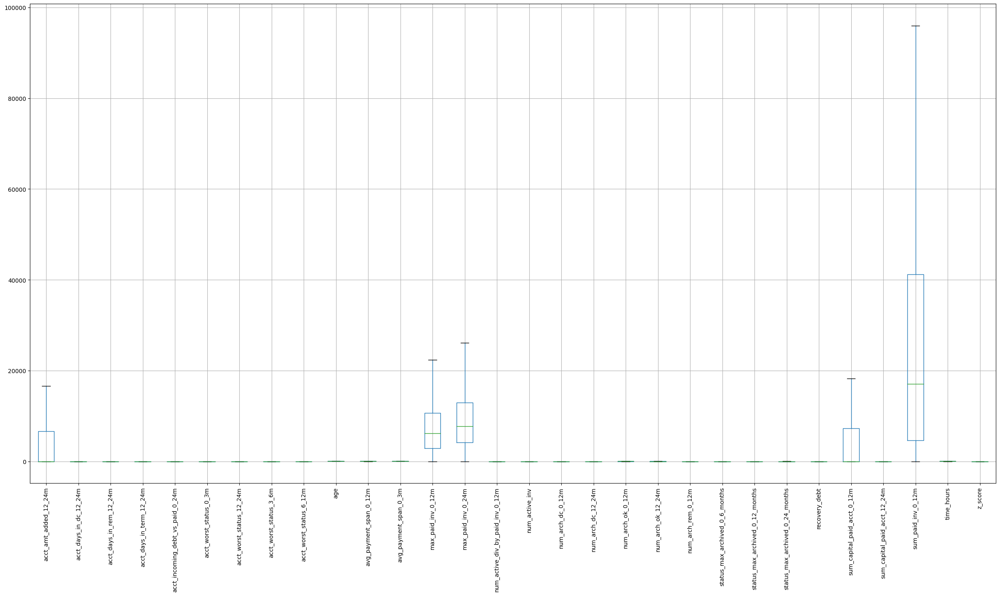

In [28]:
plt.figure(figsize=(30,15))
bank_data_copy.boxplot();
plt.xticks(rotation= 90)
plt.show()

In [29]:
bank_data_copy.select_dtypes('category').columns

Index(['default', 'acct_status', 'merchant_category', 'merchant_group',
       'has_paid'],
      dtype='object')

In [30]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

categorical = ['default', 'acct_status', 'merchant_category', 'merchant_group', 'has_paid']

scaler = StandardScaler()
le = LabelEncoder()
ohe = OneHotEncoder(categories='auto', sparse=False)

label_encoded = bank_data_copy[categorical].apply(le.fit_transform)
scaled_columns = scaler.fit_transform(bank_data_copy[numeric])


column_name = np.concatenate([categorical, numeric])
processed_data = pd.DataFrame(np.concatenate([label_encoded, scaled_columns], axis=1), columns=column_name)


In [31]:
processed_data.head()

,default,acct_status,merchant_category,merchant_group,has_paid,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,...,num_arch_ok_12_24m,num_arch_rem_0_12m,status_max_archived_0_6_months,status_max_archived_0_12_months,status_max_archived_0_24_months,recovery_debt,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours
0,0.0,0.0,15.0,7.0,1.0,-0.596209,0.0,0.0,0.0,5.551115e-17,...,2.004991,0.0,0.258995,0.0,-0.289721,0.0,-0.599397,0.0,2.212972,-1.284735
1,0.0,0.0,4.0,4.0,1.0,-0.596209,0.0,0.0,0.0,5.551115e-17,...,2.206389,0.0,0.258995,0.0,0.987716,0.0,-0.599397,0.0,0.673325,-0.513403
2,0.0,0.0,22.0,4.0,1.0,-0.596209,0.0,0.0,0.0,5.551115e-17,...,-0.814574,0.0,0.258995,0.0,0.987716,0.0,-0.599397,0.0,2.212972,-0.867459
3,0.0,0.0,22.0,4.0,1.0,-0.596209,0.0,0.0,0.0,5.551115e-17,...,2.206389,0.0,0.258995,0.0,-0.289721,0.0,-0.599397,0.0,2.212972,0.048411
4,0.0,0.0,25.0,3.0,1.0,-0.596209,0.0,0.0,0.0,5.551115e-17,...,-0.814574,0.0,0.258995,0.0,-0.289721,0.0,-0.599397,0.0,-0.699866,-0.618952


In [32]:
processed_data.shape

(97170, 34)

In [33]:
processed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97170 entries, 0 to 97169
Data columns (total 34 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   default                           97170 non-null  float64
 1   acct_status                       97170 non-null  float64
 2   merchant_category                 97170 non-null  float64
 3   merchant_group                    97170 non-null  float64
 4   has_paid                          97170 non-null  float64
 5   acct_amt_added_12_24m             97170 non-null  float64
 6   acct_days_in_dc_12_24m            97170 non-null  float64
 7   acct_days_in_rem_12_24m           97170 non-null  float64
 8   acct_days_in_term_12_24m          97170 non-null  float64
 9   acct_incoming_debt_vs_paid_0_24m  97170 non-null  float64
 10  acct_worst_status_0_3m            97170 non-null  float64
 11  acct_worst_status_12_24m          97170 non-null  float64
 12  acct

In [34]:
processed_data['default'] = processed_data['default'].astype('category')
processed_data['acct_status']= processed_data['acct_status'].astype('category')
processed_data['merchant_category']= processed_data['merchant_category'].astype('category')
processed_data['merchant_group'] = processed_data['merchant_group'].astype('category')
processed_data['has_paid'] = processed_data['has_paid'].astype('category')

In [35]:
processed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97170 entries, 0 to 97169
Data columns (total 34 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   default                           97170 non-null  category
 1   acct_status                       97170 non-null  category
 2   merchant_category                 97170 non-null  category
 3   merchant_group                    97170 non-null  category
 4   has_paid                          97170 non-null  category
 5   acct_amt_added_12_24m             97170 non-null  float64 
 6   acct_days_in_dc_12_24m            97170 non-null  float64 
 7   acct_days_in_rem_12_24m           97170 non-null  float64 
 8   acct_days_in_term_12_24m          97170 non-null  float64 
 9   acct_incoming_debt_vs_paid_0_24m  97170 non-null  float64 
 10  acct_worst_status_0_3m            97170 non-null  float64 
 11  acct_worst_status_12_24m          97170 non-null  floa

In [36]:
X= processed_data.drop('default', axis=1)
y= processed_data.pop('default')

In [37]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression


k_best = SelectKBest(score_func=f_regression, k=15)
X_new = k_best.fit_transform(X, y)

In [38]:
selected_indices = k_best.get_support(indices=True)

selected_feature_names = processed_data.columns[selected_indices]
print("Selected Features:", selected_feature_names)

print("Feature Scores:", k_best.scores_)

bank_data_new = pd.DataFrame(data=X_new, columns=selected_feature_names)

Selected Features: Index(['acct_status', 'merchant_category', 'merchant_group', 'has_paid',
       'acct_amt_added_12_24m', 'age', 'avg_payment_span_0_12m',
       'max_paid_inv_0_12m', 'max_paid_inv_0_24m', 'num_active_inv',
       'num_arch_ok_0_12m', 'num_arch_ok_12_24m',
       'status_max_archived_0_6_months', 'sum_capital_paid_acct_0_12m',
       'sum_paid_inv_0_12m'],
      dtype='object')
Feature Scores: [9.19601975e+02 1.34545677e+02 3.87516623e+01 7.46414786e+01
 4.33376418e+01 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.50520254e+02 3.58829884e+02 1.85865610e-01
 2.46827939e+02 2.51811164e+02 9.45338927e+00 3.23090266e+01
 0.00000000e+00 0.00000000e+00 5.38033275e+02 4.50735902e+02
 0.00000000e+00 9.39610662e+01 0.00000000e+00 3.18414516e+01
 0.00000000e+00 3.36681802e+01 0.00000000e+00 3.08100705e+02
 2.90269107e+00]


In [62]:
bank_data_new.head()

,acct_status,merchant_category,merchant_group,has_paid,acct_amt_added_12_24m,age,avg_payment_span_0_12m,max_paid_inv_0_12m,max_paid_inv_0_24m,num_active_inv,num_arch_ok_0_12m,num_arch_ok_12_24m,status_max_archived_0_6_months,sum_capital_paid_acct_0_12m,sum_paid_inv_0_12m
0,0.0,15.0,7.0,1.0,-0.596209,-1.248887,-0.492565,2.259294,2.211969,2.092401,1.583376,2.004991,0.258995,-0.599397,2.212972
1,0.0,4.0,4.0,1.0,-0.596209,1.148341,1.512834,0.936613,0.573262,-0.571037,0.817661,2.206389,0.258995,-0.599397,0.673325
2,0.0,22.0,4.0,1.0,-0.596209,-1.089072,0.622633,2.259294,2.211969,0.760682,1.200519,-0.814574,0.258995,-0.599397,2.212972
3,0.0,22.0,4.0,1.0,-0.596209,0.029634,-1.714146,2.259294,2.211969,0.760682,2.157663,2.206389,0.258995,-0.599397,2.212972
4,0.0,25.0,3.0,1.0,-0.596209,-0.849349,-0.445609,-0.079682,-0.305357,-0.571037,-0.713770,-0.814574,0.258995,-0.599397,-0.699866


In [63]:
X= bank_data_new

In [64]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

smote = SMOTE(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)


In [65]:
counter_before = y_train.value_counts()
print('Before Sampling:', counter_before)

counter_after = y_train_resampled.value_counts()
print('After Sampling:', counter_after)

Before Sampling: 0.0    67109
1.0      910
Name: default, dtype: int64
After Sampling: 0.0    67109
1.0    67109
Name: default, dtype: int64


**LOGISTIC REGRESSION**

In [43]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

log = LogisticRegression(random_state= 42)

log.fit(X_train, y_train)

y_pred_log = log.predict(X_test)


accuracy_log = accuracy_score(y_test, y_pred_log)
confusion_matrix_log = confusion_matrix(y_test, y_pred_log)
classification_report_log = classification_report(y_test, y_pred_log)

print('Accuracy Score of Logistic Regression Model:', accuracy_log)
print('\n Confusion matrix of Logistic Regression Model:\n', confusion_matrix_log)
print('\n Classification report of Logistic Regression Model:\n', classification_report_log)


Accuracy Score of Logistic Regression Model: 0.9873417721518988

 Confusion matrix of Logistic Regression Model:
 [[28780     1]
 [  368     2]]

 Classification report of Logistic Regression Model:
               precision    recall  f1-score   support

         0.0       0.99      1.00      0.99     28781
         1.0       0.67      0.01      0.01       370

    accuracy                           0.99     29151
   macro avg       0.83      0.50      0.50     29151
weighted avg       0.98      0.99      0.98     29151



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


**NAIVE BAYES**

In [44]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()

gnb.fit(X_train, y_train)

y_pred_gnb = gnb.predict(X_test)


accuracy_gnb = accuracy_score(y_test, y_pred_gnb)
confusion_matrix_gnb = confusion_matrix(y_test, y_pred_gnb)
classification_report_gnb = classification_report(y_test, y_pred_gnb)

print('Accuracy Score of Naive Bayes Model:', accuracy_gnb)
print('\n Confusion matrix of Naive Bayes Model:\n', confusion_matrix_gnb)
print('\n Classification report of Naive Bayes Model:\n', classification_report_gnb)

Accuracy Score of Naive Bayes Model: 0.9605502384137765

 Confusion matrix of Naive Bayes Model:
 [[27935   846]
 [  304    66]]

 Classification report of Naive Bayes Model:
               precision    recall  f1-score   support

         0.0       0.99      0.97      0.98     28781
         1.0       0.07      0.18      0.10       370

    accuracy                           0.96     29151
   macro avg       0.53      0.57      0.54     29151
weighted avg       0.98      0.96      0.97     29151



**DECISION TREE CLASSIFIER**


In [49]:
from sklearn.tree import DecisionTreeClassifier

dtclf= DecisionTreeClassifier()

dtclf.fit(X_train, y_train)

y_pred_dtclf = dtclf.predict(X_test)


accuracy_dtclf = accuracy_score(y_test, y_pred_dtclf)
confusion_matrix_dtclf = confusion_matrix(y_test, y_pred_dtclf)
classification_report_dtclf = classification_report(y_test, y_pred_dtclf)

print('Accuracy Score of Decision Tree Classifier Model:', accuracy_dtclf)
print('\n Confusion matrix of Decision Tree Classifier Model:\n', confusion_matrix_dtclf)
print('\n Classification report of Decision Tree Classifier Model:\n', classification_report_dtclf)

Accuracy Score of Decision Tree Classifier Model: 0.9774278755445782

 Confusion matrix of Decision Tree Classifier Model:
 [[28450   331]
 [  327    43]]

 Classification report of Decision Tree Classifier Model:
               precision    recall  f1-score   support

         0.0       0.99      0.99      0.99     28781
         1.0       0.11      0.12      0.12       370

    accuracy                           0.98     29151
   macro avg       0.55      0.55      0.55     29151
weighted avg       0.98      0.98      0.98     29151



**RANDOM FOREST CLASSIFIER**

In [46]:
from sklearn.ensemble import RandomForestClassifier

rclf = RandomForestClassifier()

rclf.fit(X_train, y_train)

y_pred_rclf = rclf.predict(X_test)


accuracy_rclf = accuracy_score(y_test, y_pred_rclf)
confusion_matrix_rclf = confusion_matrix(y_test, y_pred_rclf)
classification_report_rclf = classification_report(y_test, y_pred_rclf)

print('Accuracy Score of Random Forest Classifier Model:', accuracy_rclf)
print('\n Confusion matrix of Random Forest Classifier Model:\n', confusion_matrix_rclf)
print('\n Classification report of Random Forest Classifier Model:\n', classification_report_rclf)

Accuracy Score of Random Forest Classifier Model: 0.986449864498645

 Confusion matrix of Random Forest Classifier Model:
 [[28738    43]
 [  352    18]]

 Classification report of Random Forest Classifier Model:
               precision    recall  f1-score   support

         0.0       0.99      1.00      0.99     28781
         1.0       0.30      0.05      0.08       370

    accuracy                           0.99     29151
   macro avg       0.64      0.52      0.54     29151
weighted avg       0.98      0.99      0.98     29151



**MODEL TUNING**

In [51]:
from sklearn.model_selection import GridSearchCV

In [47]:
models = {
    'LogisticRegression': {
        'model': LogisticRegression(),
        'params': {
            'C': [0.001, 0.01, 0.1, 1, 10],
            'penalty': ['l1', 'l2'],
        }
    },
    'NaiveBayes': {
        'model': GaussianNB(),
        'params': {}
    },
    'DecisionTreeClassifier': {
        'model': DecisionTreeClassifier(),
        'params': {
            'max_depth': [50, 100, 150, 200],
            'min_samples_split': [25, 50, 75],
        }
    },
    'RandomForestClassifier': {
        'model': RandomForestClassifier(),
        'params': {
            'n_estimators': [10, 50, 100, 150],
            'max_depth': [50, 100, 150, 200],
        }
    }
}

results = {}


In [54]:
for model_name, model_info in models.items():
    clf = model_info['model']
    params = model_info['params']

    # Create a GridSearchCV object
    grid_search = GridSearchCV(clf, params, cv=5, scoring='accuracy', verbose=1)

    grid_search.fit(X_train, y_train)

    # Get the best hyperparameters and corresponding model
    best_params = grid_search.best_params_
    best_model = grid_search.best_estimator_

    # Make predictions on the test data
    y_pred = best_model.predict(X_test)

    # Calculate accuracy on the test data
    accuracy = accuracy_score(y_test, y_pred)

    # Store results in the dictionary
    results[model_name] = {
        'best_params': best_params,
        'best_model': best_model,
        'test_accuracy': accuracy,

    }

# Print the results for each model
for model_name, result in results.items():
    print(f"Model: {model_name}")
    print(f"Best Parameters: {result['best_params']}")
    print(f"Test Accuracy: {result['test_accuracy']}\n")

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 16 candidates, totalling 80 fits
Model: LogisticRegression
Best Parameters: {'C': 0.001, 'penalty': 'l2'}
Test Accuracy: 0.987307468011389

Model: NaiveBayes
Best Parameters: {}
Test Accuracy: 0.9605502384137765

Model: DecisionTreeClassifier
Best Parameters: {'max_depth': 100, 'min_samples_split': 75}
Test Accuracy: 0.986587081060684

Model: RandomForestClassifier
Best Parameters: {'max_depth': 100, 'n_estimators': 50}
Test Accuracy: 0.9862783437960961



**Logistic Regression with hyper tuned parameter**

In [57]:
log= LogisticRegression(C=0.001, penalty= 'l2', random_state=42)

log.fit(X_train, y_train)

y_pred_log = log.predict(X_test)


accuracy_log = accuracy_score(y_test, y_pred_log)
confusion_matrix_log = confusion_matrix(y_test, y_pred_log)
classification_report_log = classification_report(y_test, y_pred_log)

print('Accuracy Score of Logistic Regression Model:', accuracy_log)
print('\n Confusion matrix of Logistic Regression Model:\n', confusion_matrix_log)
print('\n Classification report of Logistic Regression Model:\n', classification_report_log)


Accuracy Score of Logistic Regression Model: 0.987307468011389

 Confusion matrix of Logistic Regression Model:
 [[28781     0]
 [  370     0]]

 Classification report of Logistic Regression Model:
               precision    recall  f1-score   support

         0.0       0.99      1.00      0.99     28781
         1.0       0.00      0.00      0.00       370

    accuracy                           0.99     29151
   macro avg       0.49      0.50      0.50     29151
weighted avg       0.97      0.99      0.98     29151



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


**Random Forest Classifier with hyper tuned parameters**

In [66]:
rclf = RandomForestClassifier(max_depth= 100, n_estimators= 50)

rclf.fit(X_train, y_train)

y_pred_rclf = rclf.predict(X_test)


accuracy_rclf = accuracy_score(y_test, y_pred_rclf)
confusion_matrix_rclf = confusion_matrix(y_test, y_pred_rclf)
classification_report_rclf = classification_report(y_test, y_pred_rclf)

print('Accuracy Score of Random Forest Classifier Model:', accuracy_rclf)
print('\n Confusion matrix of Random Forest Classifier Model:\n', confusion_matrix_rclf)
print('\n Classification report of Random Forest Classifier Model:\n', classification_report_rclf)

Accuracy Score of Random Forest Classifier Model: 0.9863812562176255

 Confusion matrix of Random Forest Classifier Model:
 [[28737    44]
 [  353    17]]

 Classification report of Random Forest Classifier Model:
               precision    recall  f1-score   support

         0.0       0.99      1.00      0.99     28781
         1.0       0.28      0.05      0.08       370

    accuracy                           0.99     29151
   macro avg       0.63      0.52      0.54     29151
weighted avg       0.98      0.99      0.98     29151

